Prototype for difference gradience assisted alignment.

Goal:
- If the user, or another module, can get alignment within ~10-30 pixels this will be able to solve it to pixel perfect.

In [7]:
from os.path import abspath
from sys import path
path.insert(0, abspath("../.."))  # Repository directory relative to this file.
from MISalign.model.mis_file import MisFile,load_mis

mis_fp=r"..\..\example\data\set_a\mymis.mis"

In [9]:
mp=load_mis(mis_fp)

FileNotFoundError: [Errno 2] No such file or directory: '..\\..\\example\\data\\set_a\\mymis.mis'

In [ ]:
# ['a_myimages01.jpg', 'a_myimages02.jpg']
mp.check_image_paths()

In [ ]:
from MISalign.canvas.canvas_solve import rectangular_solve
import MISalign.canvas.canvas_render as cr
from matplotlib import pyplot as plt
import numpy as np

In [ ]:
relations=mp.get_rels('r')
image_names=mp.get_image_names()
origin="a_myimages01.jpg"
origin_relative_offsets=rectangular_solve(
    relations=relations,
    image_names=image_names,
    origin=origin
)
display(origin_relative_offsets)

In [ ]:
image_sizes=cr.find_image_sizes(mp.get_image_paths())
image_sizes

In [ ]:
images_to_diff=['a_myimages03.jpg', 'a_myimages04.jpg']
img_a_oro=np.array(origin_relative_offsets[images_to_diff[0]])#Image A origin relative offset
img_a_size=image_sizes[images_to_diff[0]]#Image A Size
img_a_corners=[
    img_a_oro*[-1,1],
    img_a_oro*[-1,1]+[0,-img_a_size[1]],
    img_a_oro*[-1,1]+[img_a_size[0],-img_a_size[1]],
    img_a_oro*[-1,1]+[img_a_size[0],0],
    ]
img_b_oro=np.array(origin_relative_offsets[images_to_diff[1]])#Image B origin relative offset
img_b_size=image_sizes[images_to_diff[1]]#Image B Size
img_b_corners=[
    img_b_oro*[-1,1],
    img_b_oro*[-1,1]+[0,-img_b_size[1]],
    img_b_oro*[-1,1]+[img_b_size[0],-img_b_size[1]],
    img_b_oro*[-1,1]+[img_b_size[0],0],
    ]

img_a_set=np.array(img_a_corners+[img_a_corners[0]])
img_b_set=np.array(img_b_corners+[img_b_corners[0]])
plt.plot(img_a_set.T[0],img_a_set.T[1])
plt.plot(img_b_set.T[0],img_b_set.T[1])

#find overlap in ORO reference frame - subtract ORO of each image to get local coordinates.
image_a={
    "oro":origin_relative_offsets[images_to_diff[0]],
    "size":image_sizes[images_to_diff[0]]
}
image_b={
    "oro":origin_relative_offsets[images_to_diff[1]],
    "size":image_sizes[images_to_diff[1]]
}
x_positions=[-image_a["oro"][0],-image_a["oro"][0]+image_a["size"][0],-image_b["oro"][0],-image_b["oro"][0]+image_b["size"][0]]
x_positions.sort()
x_overlap=x_positions[1:3]
y_positions=[image_a["oro"][1],image_a["oro"][1]-image_a["size"][1],image_b["oro"][1],image_b["oro"][1]-image_b["size"][1]]
y_positions.sort(reverse=True)
y_overlap=y_positions[1:3]
print("ORO frame X and Y overlaps",x_overlap,y_overlap)
image_a_overlap=[[x+image_a["oro"][0] for x in x_overlap],[-y+image_a["oro"][1] for y in y_overlap]]
print("A frame X and Y overlaps",image_a_overlap)
image_b_overlap=[[x+image_b["oro"][0] for x in x_overlap],[-y+image_b["oro"][1] for y in y_overlap]]
print("B frame X and Y overlaps",image_b_overlap)



plt.plot([x_overlap[0],x_overlap[1],x_overlap[1],x_overlap[0],x_overlap[0]],[y_overlap[0],y_overlap[0],y_overlap[1],y_overlap[1],y_overlap[0]],"r.")
plt.gca().set_aspect('equal')

In [ ]:
#extract overlapping regions from images
from PIL import Image as PILImage
import numpy as np

In [ ]:

img_fp=mp.get_image_paths()[images_to_diff[0]]
with PILImage.open(img_fp) as open_image:
    img_arr_a=np.array(open_image)
# plt.imshow(img_arr_a)
# plt.figure()
img_a_roo=img_arr_a[image_a_overlap[1][0]:image_a_overlap[1][1],image_a_overlap[0][0]:image_a_overlap[0][1]]#region of overlap
plt.imshow(img_a_roo)
plt.figure()
img_fp=mp.get_image_paths()[images_to_diff[1]]
with PILImage.open(img_fp) as open_image:
    img_arr_b=np.array(open_image)
# plt.imshow(img_arr_b)
# plt.figure()
img_b_roo=img_arr_b[image_b_overlap[1][0]:image_b_overlap[1][1],image_b_overlap[0][0]:image_b_overlap[0][1]]
plt.imshow(img_b_roo)
plt.figure()
plt.imshow(abs(img_a_roo.astype(int)-img_b_roo.astype(int)))

# Develop functions to get numerical representation of offset match.

## Setup

In [ ]:
from os.path import abspath
from sys import path
path.insert(0, abspath("../.."))  # Repository directory relative to this file.
from MISalign.model.mis_file import MisFile,load_mis

mis_fp=r"..\..\example\data\set_a\mymis.mis"
mp=load_mis(mis_fp)

FileNotFoundError: [Errno 2] No such file or directory: '..\\..\\example\\data\\set_a\\mymis.mis'

In [ ]:
from MISalign.canvas.canvas_solve import rectangular_solve
import MISalign.canvas.canvas_render as cr
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image as PILImage

In [ ]:
relations=mp.get_rels('r')
image_names=mp.get_image_names()
origin="a_myimages01.jpg"
origin_relative_offsets=rectangular_solve(
    relations=relations,
    image_names=image_names,
    origin=origin
)
image_sizes=cr.find_image_sizes(mp.get_image_paths())

## Function-based code

In [ ]:
def get_overlap(origin_relative_offsets,image_sizes,images)->np.ndarray:
    oro_select={name:origin_relative_offsets[name] for name in images}
    is_select={name:image_sizes[name] for name in images}
    origin_relative_extents=cr.find_relative_extents(
        image_names=images,
        origin_relative_offsets=oro_select,
        image_sizes=is_select)
    canvas_extents, canvas_offsets=cr.resolve_extents(origin_relative_extents)
    canvas_relative_offsets=cr.place_in_canvas(
        images,
        oro_select,
        canvas_extents,
        canvas_offsets)
    overlap_array=cr.build_normalization(
        images,
        is_select,
        canvas_relative_offsets,
        canvas_extents,
        cr.weight_flat
    )
    return overlap_array,canvas_relative_offsets

In [ ]:
## check to confirm that there is in fact overlap
def check_overlap(origin_relative_offsets,image_sizes,image_name_a,image_name_b)->bool:
    return np.any(get_overlap(origin_relative_offsets,image_sizes,[image_name_a,image_name_b])[0]==2)
check_overlap(origin_relative_offsets,image_sizes,'a_myimages03.jpg','a_myimages04.jpg')
#This also works for rotated images assuming weight_flat is updated to handle rotation.

True

[1058, 2258, 129, 1729]

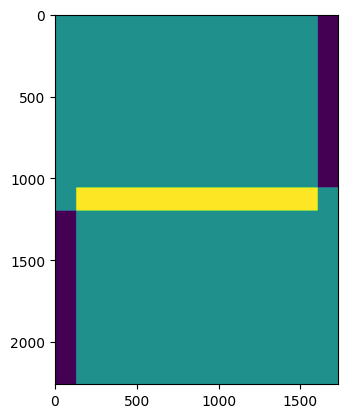

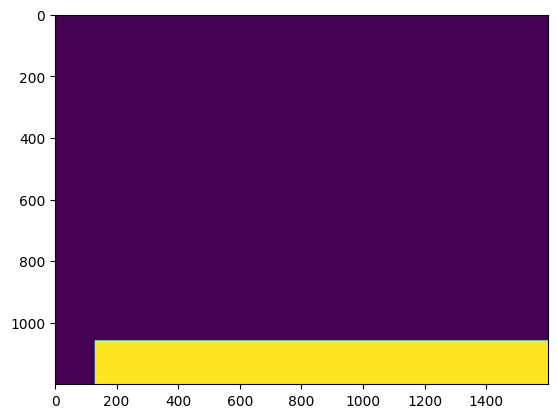

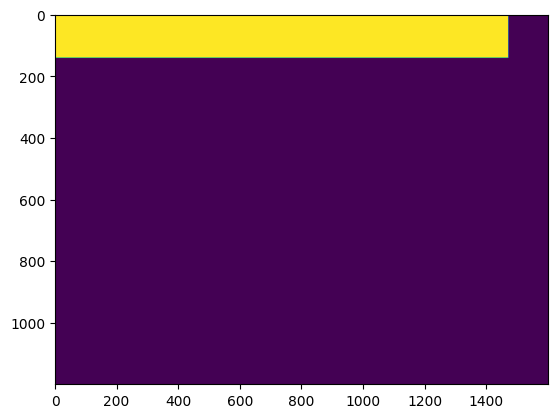

In [ ]:
## Calculate ORO-coordinate overlap
overlap_array,canvas_relative_offsets=get_overlap(origin_relative_offsets,image_sizes,['a_myimages03.jpg','a_myimages04.jpg'])
plt.imshow(overlap_array)
plt.figure()
# plt.imshow(overlap_array==2)
## Calculate A- and B-coordinate overlaps
A_isolate=[canvas_relative_offsets['a_myimages03.jpg'][1],
           canvas_relative_offsets['a_myimages03.jpg'][1]+image_sizes['a_myimages03.jpg'][1],
           canvas_relative_offsets['a_myimages03.jpg'][0],
           canvas_relative_offsets['a_myimages03.jpg'][0]+image_sizes['a_myimages03.jpg'][0]
           ]
A_iso_arr=(overlap_array)[A_isolate[0]:A_isolate[1],A_isolate[2]:A_isolate[3]]
plt.imshow(A_iso_arr)

plt.figure()
B_isolate=[canvas_relative_offsets['a_myimages04.jpg'][1],
           canvas_relative_offsets['a_myimages04.jpg'][1]+image_sizes['a_myimages04.jpg'][1],
           canvas_relative_offsets['a_myimages04.jpg'][0],
           canvas_relative_offsets['a_myimages04.jpg'][0]+image_sizes['a_myimages04.jpg'][0]
           ]
B_iso_arr=(overlap_array)[B_isolate[0]:B_isolate[1],B_isolate[2]:B_isolate[3]]
plt.imshow(B_iso_arr)
B_isolate

In [ ]:
A_iso_arr.repeat

In [ ]:
## Get difference given A- and B-coordinate overlaps
img_fp=mp.get_image_paths()['a_myimages03.jpg']
with PILImage.open(img_fp) as open_image:
    img_arr_a=np.array(open_image)
plt.figure()
plt.imshow(img_arr_a[(A_iso_arr==2)].reshape(142,1471,3))
plt.figure()
plt.imshow(A_iso_arr==2)

img_fp=mp.get_image_paths()['a_myimages04.jpg']
with PILImage.open(img_fp) as open_image:
    img_arr_b=np.array(open_image)
plt.figure()
plt.imshow(img_arr_b[(B_iso_arr==2)].reshape(142,1471,3))
plt.figure()
plt.imshow(B_iso_arr==2)


plt.figure()
plt.imshow(np.abs(img_arr_a[(A_iso_arr==2)].reshape(142,1471,3).astype(int)-img_arr_b[(B_iso_arr==2)].reshape(142,1471,3).astype(int)))


NameError: name 'mp' is not defined

Issue with this approach: Each permutation requires generation of a grid - this might be better for non-rectangular images but for this specific use case it seems like a large amount of extra work. Probably want to use numerical approach.

Also, all of this has been ORO-based but it could/should be image-image offset based.

In [ ]:
diff_grad_rel=mp.get_rels('r')[2]
print(diff_grad_rel)
# [('a_myimages03.jpg', 'a_myimages04.jpg'), (-129, -1058)]
# The top left corner of a3 is at the 'origin'. The top left corner of a4 is 129 to the right and 1058 down

NameError: name 'mp' is not defined

In [ ]:
check_distance=3
check_shape=(1+check_distance*2,1+check_distance*2)
check_grid=np.fromfunction(lambda x,y: np.array([x-check_distance,y-check_distance]),shape=check_shape)
plt.plot(check_grid[0].flatten(),check_grid[1].flatten(),".")
plt.gca().set_aspect('equal')

offset_test_grid=np.full((2,*check_shape),np.array([[diff_grad_rel[1]]]).T)+check_grid

test_values=np.fromfunction(lambda x,y: np.abs(x-check_distance)+np.abs(y-check_distance),shape=check_shape)
plt.imshow(test_values)

NameError: name 'np' is not defined

In [ ]:
def get_image_array(mp:MisFile,image_name):
    with PILImage.open(mp.get_image_paths()[image_name]) as open_image:
        img_arr=np.array(open_image)
    return img_arr
# plt.imshow(get_image_array(mp,'a_myimages03.jpg'))

In [ ]:
results=np.full(check_shape,np.nan).flatten()
for i,(xo,yo) in enumerate(zip(
        offset_test_grid[0].reshape(-1,1),
        offset_test_grid[1].reshape(-1,1)
        )):
    print(i,xo,yo)
    #check if this offset is valid i.e. hasn't separated images

    #get overlap difference
    
    #generate metric value

    #store metric value in results array using index

# Overlap Function

In [ ]:
Ax,Ay=(1600,1200)
Ashape=(Ax,Ay)
Bx,By=(1600,1200)
Bshape=(Bx,By)

offsets_to_test=[
    (1500,1100),
    (1500,-1100),
    (-1500,1100),
    (-1500,-1100),
    (1500,0),
    (0,1100),
    (-1500,0),
    (0,-1100)
]

In [ ]:
def axis_span(OVn,Anmax,Bnmax):
    if OVn==0:
        Anspan=[0,min(Anmax,Bnmax)]
        bnspan=[0,min(Anmax,Bnmax)]
    elif OVn > 0:
        Anspan=[OVn,Anmax]
        bnspan=[0,Anmax-OVn]
    elif OVn < 0:
        Anspan=[0,Bnmax+OVn]
        bnspan=[-OVn,Bnmax]
    else:
        ValueError()
    return Anspan,bnspan



for offset_vector in offsets_to_test:
    print("Offset:",offset_vector)
    print("Validity check:",offset_vector[0]>-Bx,offset_vector[0]<Ax,offset_vector[1]>-By,offset_vector[1]<Ay)
    print("X spans:",axis_span(offset_vector[0],Ax,Bx))
    print("Y spans:",axis_span(offset_vector[1],Ay,By))


Offset: (1500, 1100)
Validity check: True True True True
X spans: ([1500, 1600], [0, 100])
Y spans: ([1100, 1200], [0, 100])
Offset: (1500, -1100)
Validity check: True True True True
X spans: ([1500, 1600], [0, 100])
Y spans: ([0, 100], [1100, 1200])
Offset: (-1500, 1100)
Validity check: True True True True
X spans: ([0, 100], [1500, 1600])
Y spans: ([1100, 1200], [0, 100])
Offset: (-1500, -1100)
Validity check: True True True True
X spans: ([0, 100], [1500, 1600])
Y spans: ([0, 100], [1100, 1200])
Offset: (1500, 0)
Validity check: True True True True
X spans: ([1500, 1600], [0, 100])
Y spans: ([0, 1200], [0, 1200])
Offset: (0, 1100)
Validity check: True True True True
X spans: ([0, 1600], [0, 1600])
Y spans: ([1100, 1200], [0, 100])
Offset: (-1500, 0)
Validity check: True True True True
X spans: ([0, 100], [1500, 1600])
Y spans: ([0, 1200], [0, 1200])
Offset: (0, -1100)
Validity check: True True True True
X spans: ([0, 1600], [0, 1600])
Y spans: ([0, 100], [1100, 1200])


In [ ]:
def axis_span(OVn,Anmax,Bnmax):
    if OVn==0:
        Anspan=(0,min(Anmax,Bnmax))
        bnspan=(0,min(Anmax,Bnmax))
    elif OVn > 0:
        Anspan=(OVn,Anmax)
        bnspan=(0,Anmax-OVn)
    elif OVn < 0:
        Anspan=(0,Bnmax+OVn)
        bnspan=(-OVn,Bnmax)
    else:
        ValueError()
    return Anspan,bnspan
    #TODO invert these to match orientation of offset vector being from bottom left of A towards the top/right.

def overlap_spans(offset_vector:tuple,a_shape:tuple,b_shape:tuple):
    if not all([offset_vector[0]>-b_shape[0],offset_vector[0]<a_shape[0],offset_vector[1]>-b_shape[1],offset_vector[1]<a_shape[1]]):
        ValueError("These images do not overlap")
    xspans=axis_span(offset_vector[0],a_shape[0],b_shape[0])
    yspans=axis_span(offset_vector[1],a_shape[1],b_shape[1])
    return xspans, yspans

for offset_vector in offsets_to_test:
    print("Offset: ",offset_vector)
    print("Spans(((xa),(xb)),((ya),(yb))): ",overlap_spans(offset_vector,Ashape,Bshape))

Offset:  (1500, 1100)
Spans(((xa),(xb)),((ya),(yb))):  (((1500, 1600), (0, 100)), ((1100, 1200), (0, 100)))
Offset:  (1500, -1100)
Spans(((xa),(xb)),((ya),(yb))):  (((1500, 1600), (0, 100)), ((0, 100), (1100, 1200)))
Offset:  (-1500, 1100)
Spans(((xa),(xb)),((ya),(yb))):  (((0, 100), (1500, 1600)), ((1100, 1200), (0, 100)))
Offset:  (-1500, -1100)
Spans(((xa),(xb)),((ya),(yb))):  (((0, 100), (1500, 1600)), ((0, 100), (1100, 1200)))
Offset:  (1500, 0)
Spans(((xa),(xb)),((ya),(yb))):  (((1500, 1600), (0, 100)), ((0, 1200), (0, 1200)))
Offset:  (0, 1100)
Spans(((xa),(xb)),((ya),(yb))):  (((0, 1600), (0, 1600)), ((1100, 1200), (0, 100)))
Offset:  (-1500, 0)
Spans(((xa),(xb)),((ya),(yb))):  (((0, 100), (1500, 1600)), ((0, 1200), (0, 1200)))
Offset:  (0, -1100)
Spans(((xa),(xb)),((ya),(yb))):  (((0, 1600), (0, 1600)), ((0, 100), (1100, 1200)))


# Overlap Function Image Test

In [ ]:
from os.path import abspath
from sys import path
path.insert(0, abspath("../.."))  # Repository directory relative to this file.
from MISalign.model.mis_file import MisFile,load_mis

mis_fp=r"..\..\example\data\set_a\mymis.mis"
mp=load_mis(mis_fp)

from matplotlib import pyplot as plt
import numpy as np

[[('a_myimages01.jpg', 'a_myimages02.jpg'), (12, -1088)],
 [('a_myimages02.jpg', 'a_myimages03.jpg'), (8, -1141)],
 [('a_myimages03.jpg', 'a_myimages04.jpg'), (-129, -1058)],
 [('a_myimages04.jpg', 'a_myimages05.jpg'), (11, -943)],
 [('a_myimages05.jpg', 'a_myimages06.jpg'), (5, -860)],
 [('a_myimages06.jpg', 'a_myimages07.jpg'), (10, -990)],
 [('a_myimages07.jpg', 'a_myimages08.jpg'), (9, -1009)],
 [('a_myimages08.jpg', 'a_myimages09.jpg'), (9, -939)],
 [('a_myimages09.jpg', 'a_myimages10.jpg'), (3, -722)]]

a_myimages01.jpg a_myimages02.jpg (12, -1088)
(((12, 1600), (0, 1588)), ((0, 112), (1088, 1200)))


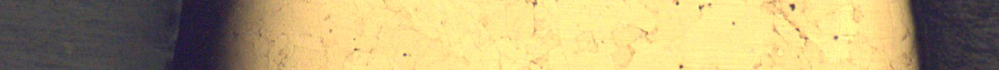

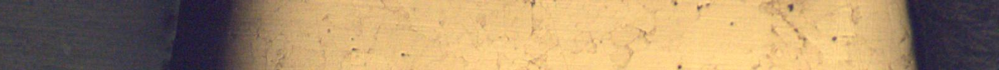

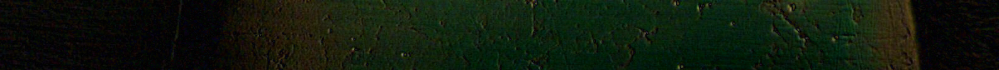

504.18453692875136
a_myimages02.jpg a_myimages03.jpg (8, -1141)
(((8, 1600), (0, 1592)), ((0, 59), (1141, 1200)))


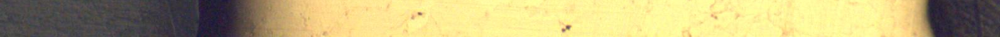

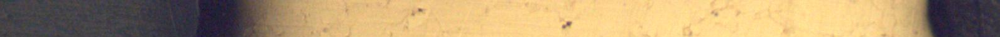

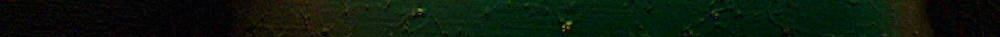

394.5149334241831
a_myimages03.jpg a_myimages04.jpg (-129, -1058)
(((0, 1471), (129, 1600)), ((0, 142), (1058, 1200)))


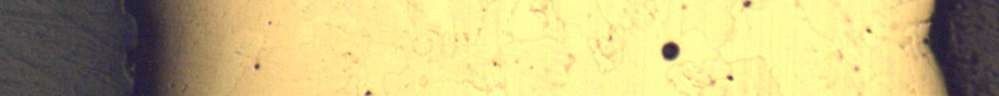

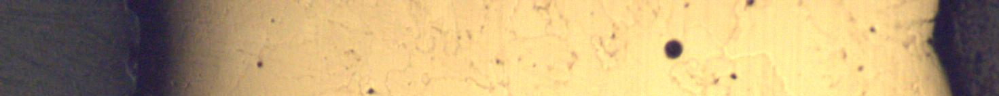

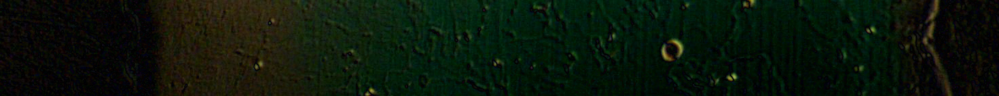

375.0050475068859
a_myimages04.jpg a_myimages05.jpg (11, -943)
(((11, 1600), (0, 1589)), ((0, 257), (943, 1200)))


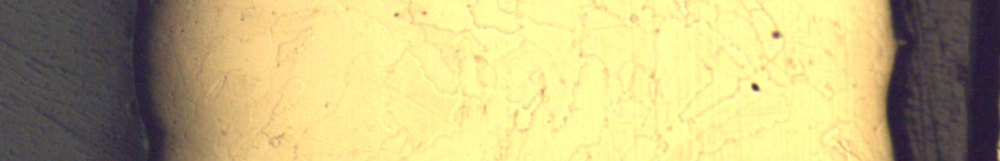

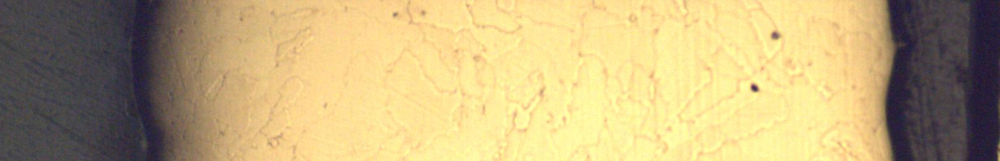

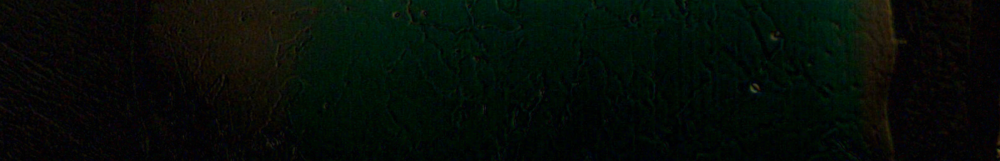

127.30786315451805
a_myimages05.jpg a_myimages06.jpg (5, -860)
(((5, 1600), (0, 1595)), ((0, 340), (860, 1200)))


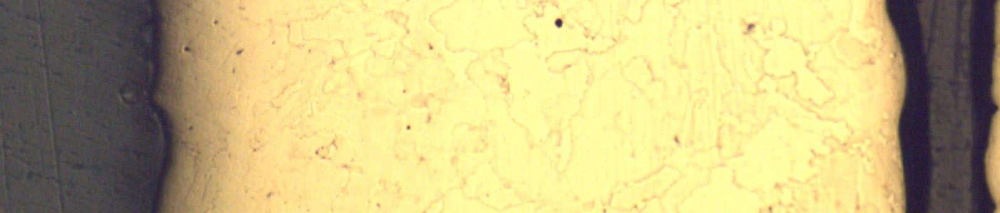

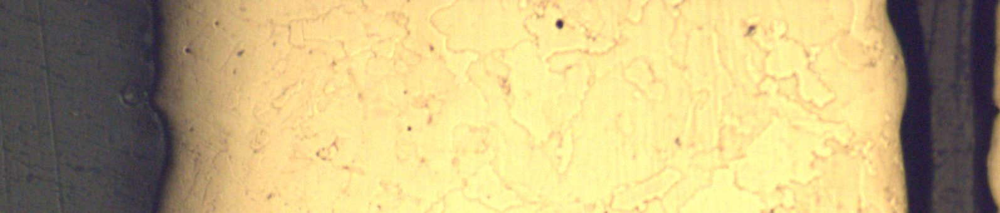

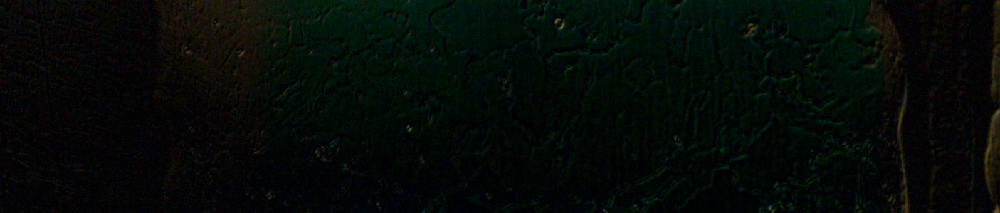

103.66404081381769
a_myimages06.jpg a_myimages07.jpg (10, -990)
(((10, 1600), (0, 1590)), ((0, 210), (990, 1200)))


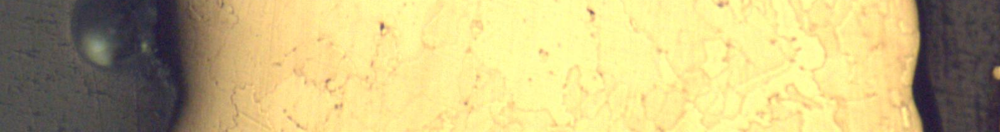

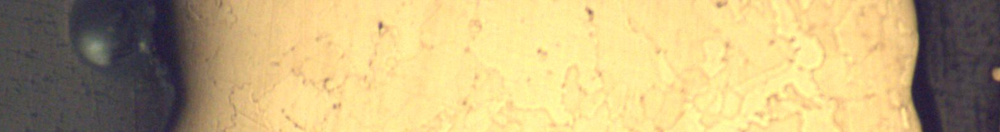

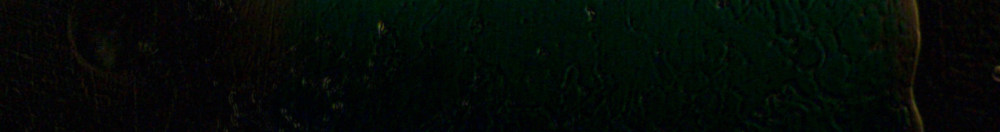

87.18139962064491
a_myimages07.jpg a_myimages08.jpg (9, -1009)
(((9, 1600), (0, 1591)), ((0, 191), (1009, 1200)))


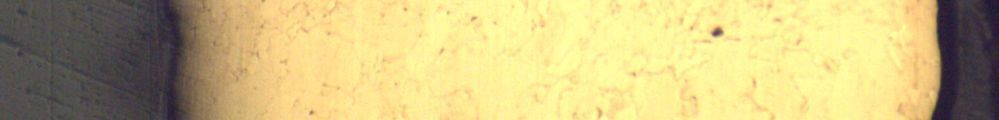

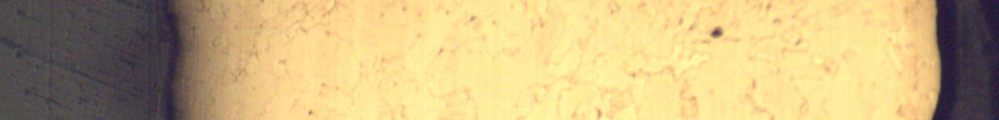

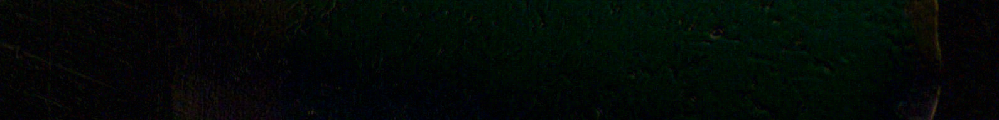

73.30197017911617
a_myimages08.jpg a_myimages09.jpg (9, -939)
(((9, 1600), (0, 1591)), ((0, 261), (939, 1200)))


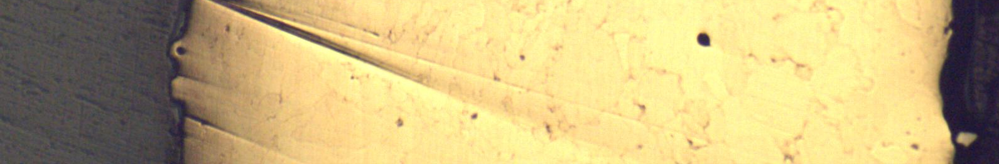

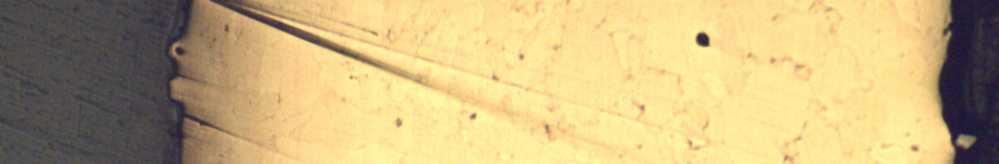

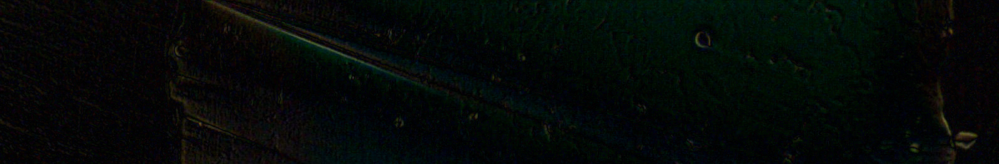

95.8900006662637
a_myimages09.jpg a_myimages10.jpg (3, -722)
(((3, 1600), (0, 1597)), ((0, 478), (722, 1200)))


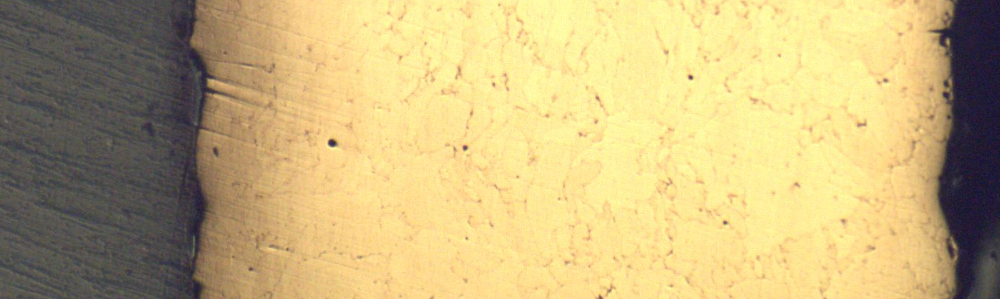

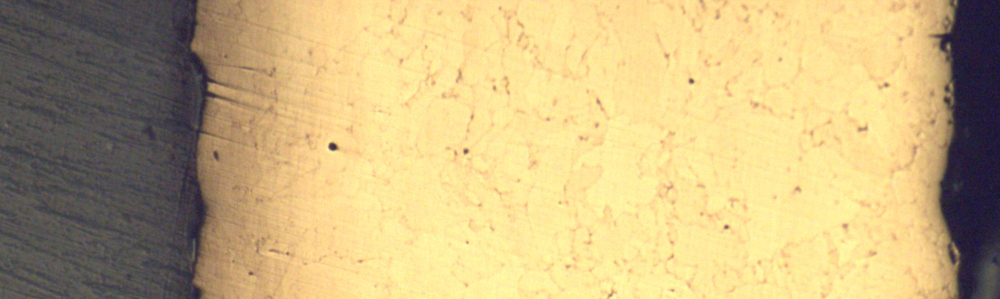

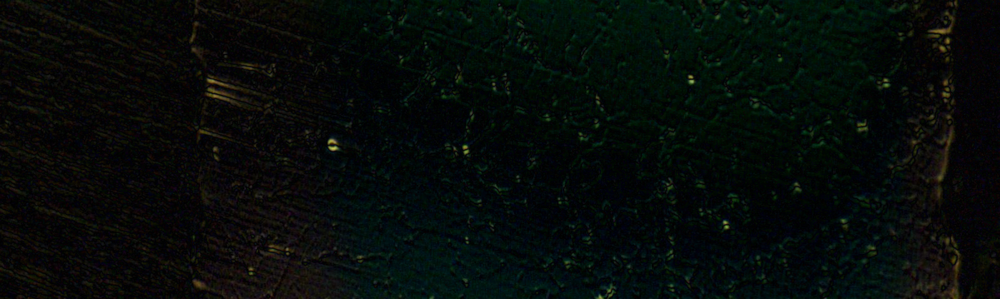

150.9719767451


In [ ]:
rect_rels=mp.get_rels('r')
display(rect_rels)
for rel_set in rect_rels:
    img_a_name=rel_set[0][0]
    img_b_name=rel_set[0][1]
    img_ab_offset=rel_set[1]
    print(img_a_name,img_b_name,img_ab_offset)
    spans=overlap_spans(
        offset_vector=img_ab_offset,
        a_shape=image_sizes[img_a_name],
        b_shape=image_sizes[img_a_name]
    )
    print(spans)

    img_fp_a=mp.get_image_paths()[img_a_name]
    with PILImage.open(img_fp_a) as open_image:
        img_arr_a=np.array(open_image)
    img_arr_a_region=img_arr_a[spans[1][1][0]:spans[1][1][1],spans[0][1][0]:spans[0][1][1]]
    display(PILImage.fromarray(img_arr_a_region)) # [x/y][b/a][start/end] # why is it b/a?
        # The origin relaive offsets seem to be inverted from historical? Which would explain b/a flip.
        # But this origin relative offsets seem to work in the solve/render.
    img_fp_b=mp.get_image_paths()[img_b_name]
    with PILImage.open(img_fp_b) as open_image:
        img_arr_b=np.array(open_image)
    img_arr_b_region=img_arr_b[spans[1][0][0]:spans[1][0][1],spans[0][0][0]:spans[0][0][1]]
    display(PILImage.fromarray(img_arr_b_region))

    img_arr_diff=img_arr_a_region.astype(int)-img_arr_b_region.astype(int)
    # iad=(np.abs(img_arr_diff**2/np.max(np.abs(img_arr_diff**2)))*255).astype(np.uint8)
    img_arr_diff_adjusted=np.abs(img_arr_diff).astype(np.uint8)
    display(PILImage.fromarray(img_arr_diff_adjusted))
    print(np.mean(img_arr_diff**2))

[[('a_myimages01.jpg', 'a_myimages02.jpg'), (12, -1088)],
 [('a_myimages02.jpg', 'a_myimages03.jpg'), (8, -1141)],
 [('a_myimages03.jpg', 'a_myimages04.jpg'), (-129, -1058)],
 [('a_myimages04.jpg', 'a_myimages05.jpg'), (11, -943)],
 [('a_myimages05.jpg', 'a_myimages06.jpg'), (5, -860)],
 [('a_myimages06.jpg', 'a_myimages07.jpg'), (10, -990)],
 [('a_myimages07.jpg', 'a_myimages08.jpg'), (9, -1009)],
 [('a_myimages08.jpg', 'a_myimages09.jpg'), (9, -939)],
 [('a_myimages09.jpg', 'a_myimages10.jpg'), (3, -722)]]

[[561 558 556 553 552 550 549 548 545 542 540 538 537 537 536 536 535 534
  534 533 533]
 [556 553 551 548 546 544 542 540 537 533 531 529 528 528 528 527 527 526
  526 526 526]
 [552 549 546 543 540 538 536 533 529 525 522 519 519 519 519 519 519 519
  520 519 520]
 [549 546 543 539 536 533 530 526 522 516 512 509 508 509 510 511 512 513
  513 514 515]
 [548 544 541 537 533 530 525 520 513 506 500 497 497 498 501 503 505 507
  508 509 510]
 [547 543 539 535 531 527 521 514 505 494 487 483 484 488 492 496 500 502
  504 506 507]
 [547 543 539 535 530 525 519 509 497 484 474 470 473 478 485 491 496 499
  502 503 505]
 [549 545 541 536 531 526 519 508 494 479 468 464 467 474 481 488 494 497
  500 502 504]
 [552 548 544 539 534 529 522 512 499 484 473 469 471 477 483 490 495 498
  501 503 504]
 [556 552 548 543 539 534 528 520 509 497 487 482 482 486 490 495 499 502
  504 505 506]
 [561 557 553 549 545 541 536 529 521 512 504 498 497 498 501 503 506 507
  508 509 510]
 [567 563 559 555 551

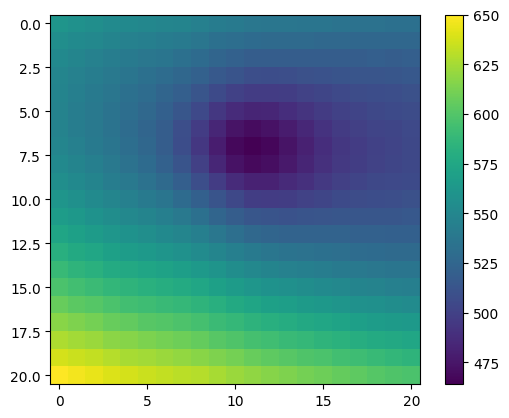

[[465 464 464 463 463 463 463 463 465 465 466 467 468 470 471 471 473 474
  474 475 476]
 [455 454 453 452 451 451 451 451 452 453 454 455 456 458 459 460 461 462
  463 463 464]
 [445 444 443 441 440 440 439 439 440 442 443 444 446 447 448 449 450 451
  452 452 453]
 [437 436 434 432 431 430 429 429 430 431 433 434 436 438 439 440 441 442
  442 443 443]
 [430 428 426 423 421 420 420 419 421 422 424 426 428 430 431 432 433 434
  434 434 434]
 [423 421 418 415 413 411 411 411 413 414 416 419 421 423 424 425 426 426
  426 426 426]
 [417 414 410 407 404 403 402 403 405 408 410 412 415 417 418 419 419 420
  419 419 419]
 [412 408 404 399 396 394 394 395 398 402 404 407 409 411 413 413 414 414
  414 413 413]
 [409 403 397 392 388 385 386 388 392 396 400 403 405 407 408 409 409 409
  409 409 408]
 [406 400 392 385 380 377 378 381 387 392 396 399 402 404 405 405 406 406
  405 405 405]
 [405 398 389 380 374 372 373 377 384 389 394 398 400 402 403 403 404 404
  403 403 402]
 [406 399 390 381 375

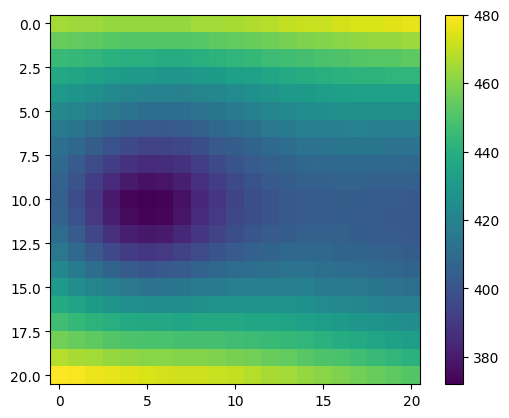

[[617 614 613 611 610 610 609 608 608 607 607 607 607 609 610 612 613 615
  618 620 623]
 [594 592 590 588 587 586 585 584 583 583 583 583 584 585 587 588 590 592
  595 598 600]
 [572 569 567 565 563 562 561 560 559 559 559 559 560 562 563 565 568 570
  573 576 579]
 [550 547 544 542 540 539 537 536 536 535 535 536 537 539 541 543 545 548
  551 554 557]
 [529 525 522 519 517 515 514 513 512 512 512 513 514 516 518 521 524 527
  530 534 537]
 [508 504 500 497 494 492 491 489 488 488 489 490 491 494 497 500 503 506
  510 514 517]
 [489 484 479 475 472 469 467 466 465 465 466 467 469 472 476 479 483 486
  490 495 498]
 [470 464 459 454 450 447 444 442 441 441 443 445 447 451 455 459 463 468
  472 476 481]
 [452 446 440 434 429 424 421 419 418 418 420 423 426 431 435 440 445 450
  455 460 464]
 [436 428 421 414 408 402 398 395 394 395 397 401 405 411 417 422 428 434
  439 444 449]
 [421 412 404 395 387 380 374 371 370 371 375 379 385 392 399 406 412 418
  424 430 435]
 [407 397 387 377 367

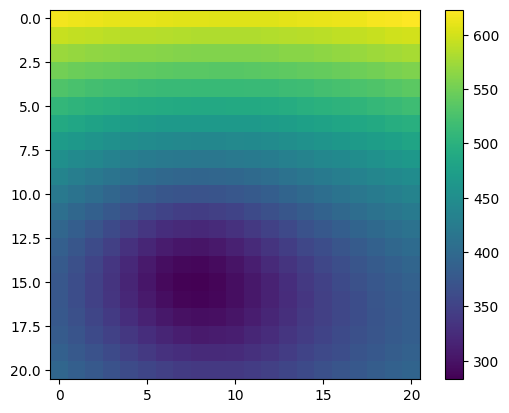

[[261 260 259 258 257 255 254 253 252 251 251 252 252 252 253 254 254 255
  256 256 256]
 [244 243 242 241 239 238 236 234 233 232 232 232 233 233 234 235 236 237
  238 238 239]
 [229 228 227 225 223 221 219 217 215 214 213 213 214 215 216 217 218 220
  221 222 223]
 [216 214 213 211 209 206 203 200 198 196 195 195 195 196 198 200 202 203
  205 207 208]
 [203 202 200 198 195 192 189 185 181 178 177 176 177 179 181 184 186 189
  191 193 195]
 [193 191 189 187 183 179 175 170 165 161 159 158 159 162 165 168 172 175
  178 181 183]
 [185 183 180 177 174 169 163 157 151 145 142 142 143 146 151 155 160 164
  167 171 173]
 [178 176 174 170 166 160 154 146 139 133 129 128 130 134 139 144 149 154
  159 162 165]
 [175 173 170 167 162 156 148 140 132 126 122 121 123 127 132 138 143 148
  153 157 160]
 [174 172 169 166 161 155 148 140 132 125 121 120 121 125 130 135 141 145
  150 154 157]
 [176 174 171 168 164 158 151 144 137 131 127 125 126 129 133 138 142 147
  151 155 158]
 [180 178 176 173 169

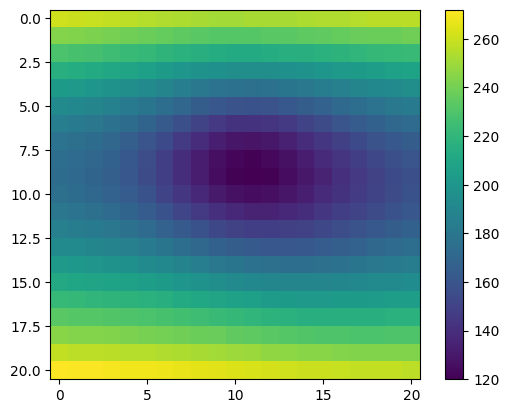

[[329 329 329 329 329 329 329 329 329 330 330 330 331 332 332 333 333 334
  335 336 336]
 [306 306 306 306 305 305 305 305 305 305 305 305 306 306 307 308 308 309
  310 311 312]
 [284 284 283 283 282 282 281 281 281 280 280 280 281 281 282 282 283 284
  285 286 287]
 [263 262 262 261 260 259 258 258 257 256 256 256 256 256 257 258 258 259
  261 262 263]
 [243 242 241 240 239 238 236 235 234 233 232 231 231 231 232 233 234 235
  237 239 240]
 [224 223 222 220 219 217 216 214 212 210 208 207 206 207 207 208 210 212
  214 216 218]
 [206 205 203 202 200 198 195 193 190 187 184 182 181 181 182 184 186 188
  191 194 197]
 [190 188 187 185 182 180 177 173 169 165 161 158 157 157 158 160 163 166
  170 173 177]
 [176 174 172 170 167 164 160 155 150 144 139 135 133 133 134 137 141 146
  150 155 159]
 [165 163 161 158 155 151 146 140 133 126 119 114 111 111 113 117 122 128
  133 138 143]
 [157 155 152 149 146 141 135 128 120 111 103  97  93  93  96 101 107 113
  120 125 131]
 [153 150 147 144 140

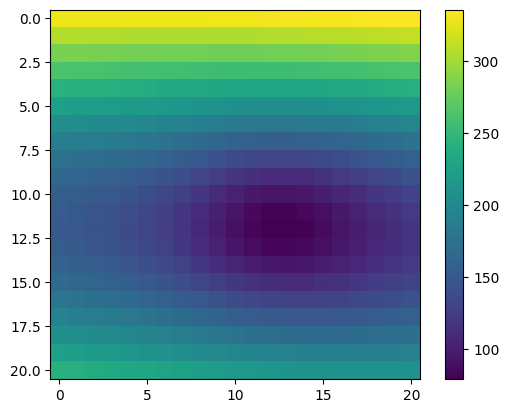

[[209 207 206 204 202 200 198 197 195 195 195 195 196 197 199 201 203 206
  209 211 214]
 [193 192 190 187 185 183 180 178 176 175 175 175 176 178 180 182 185 188
  191 194 197]
 [179 177 175 172 169 166 163 160 157 156 155 155 156 158 161 164 167 170
  173 176 180]
 [166 164 161 158 154 150 146 142 138 136 135 135 136 139 142 146 149 153
  157 160 164]
 [155 152 149 145 140 135 130 125 120 117 115 115 117 120 124 128 133 137
  141 146 149]
 [146 142 138 134 128 122 116 109 103  99  97  97  99 103 108 113 118 123
  128 133 137]
 [139 135 131 125 119 112 104  96  89  84  82  82  85  89  95 100 106 112
  117 122 127]
 [135 131 126 120 113 105  97  88  81  75  73  73  75  80  86  92  98 104
  110 115 119]
 [134 130 125 119 112 104  95  87  79  73  70  70  73  77  83  89  95 101
  106 111 116]
 [137 133 128 122 116 108 100  91  84  79  76  75  77  81  86  91  97 102
  107 112 116]
 [143 139 135 129 123 116 109 101  95  90  87  86  87  90  94  98 103 108
  112 116 120]
 [151 148 144 139 134

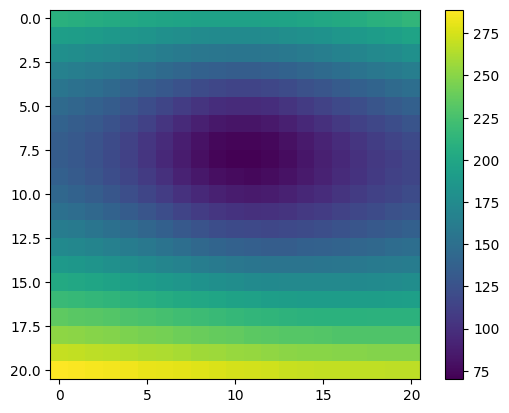

[[224 223 221 219 217 215 212 209 207 205 204 203 202 202 202 202 202 203
  203 204 204]
 [210 208 206 204 201 199 196 193 190 188 186 185 184 184 184 185 185 186
  187 188 189]
 [193 191 189 187 184 181 178 174 171 168 166 165 164 164 165 165 166 168
  169 170 171]
 [178 176 174 171 168 165 161 157 153 150 147 146 145 146 147 148 149 151
  152 154 155]
 [165 163 161 158 155 151 146 141 137 132 129 128 127 128 130 131 134 136
  138 140 142]
 [154 151 149 146 142 137 132 126 120 115 112 110 110 111 113 116 119 122
  125 127 130]
 [144 141 138 135 130 125 119 112 105  99  95  94  94  96  99 103 106 110
  113 117 119]
 [136 133 130 126 120 114 107 100  92  86  81  80  80  83  87  92  96 101
  105 108 111]
 [130 127 124 119 113 107  99  91  83  77  72  71  72  75  80  85  90  95
   99 103 106]
 [128 124 120 116 110 103  95  87  80  74  69  68  69  73  77  83  88  93
   98 102 105]
 [128 124 120 116 110 103  96  89  82  77  73  72  73  76  80  85  91  96
  100 104 107]
 [130 127 123 119 114

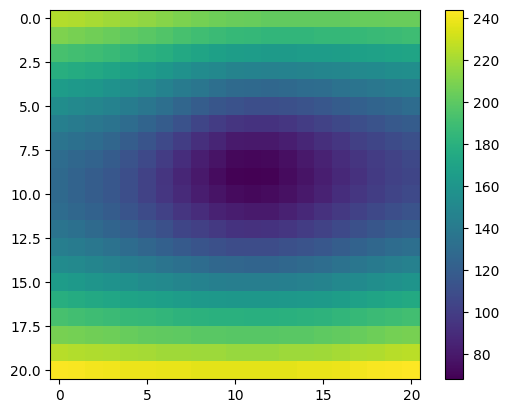

[[396 373 347 319 290 262 241 227 223 228 239 254 271 288 305 322 338 353
  368 382 395]
 [389 366 340 312 283 254 229 211 203 205 213 228 244 262 280 297 314 330
  346 361 375]
 [383 360 335 307 277 247 219 197 185 183 189 202 218 236 255 273 291 308
  325 341 356]
 [377 355 330 303 272 241 210 185 168 161 165 175 191 210 229 248 267 286
  304 322 338]
 [374 351 327 299 268 235 203 174 153 141 141 150 165 183 204 225 245 265
  284 303 320]
 [371 349 324 297 266 232 198 165 139 123 119 125 139 158 180 202 223 244
  265 285 304]
 [371 349 324 296 265 231 194 159 129 108 100 103 116 135 158 181 204 226
  248 269 289]
 [373 351 326 299 267 232 195 157 124  99  86  86  97 116 139 163 187 211
  234 255 276]
 [377 355 331 304 273 238 200 161 125  97  80  77  86 103 126 150 175 199
  223 245 267]
 [384 362 338 312 282 247 210 171 134 103  83  76  82  97 118 142 167 192
  215 238 260]
 [393 373 349 324 295 262 226 188 151 119  95  84  86  98 118 140 164 189
  212 234 256]
 [404 385 363 338 311

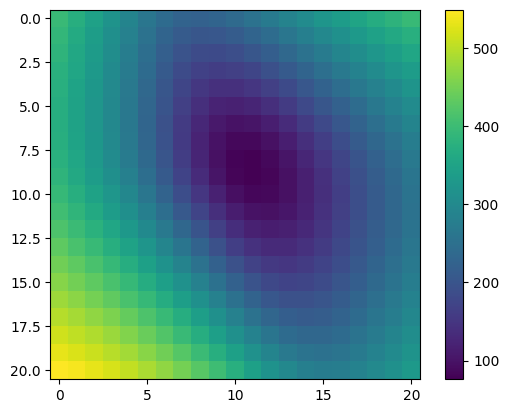

[[249 249 248 248 248 247 246 245 243 241 238 234 231 228 227 228 230 232
  234 236 238]
 [238 238 237 237 237 236 235 234 232 230 227 223 219 216 214 214 216 219
  221 223 225]
 [228 227 227 226 226 225 224 223 221 219 216 212 208 204 202 201 203 205
  208 210 213]
 [218 218 217 216 216 215 214 213 211 209 206 202 198 193 190 189 190 192
  195 198 200]
 [210 209 208 207 207 206 204 203 201 199 196 192 187 182 178 176 176 179
  182 185 188]
 [202 201 200 199 198 197 196 194 192 190 186 182 177 171 166 163 162 164
  168 171 175]
 [196 195 193 192 191 189 188 186 184 181 177 173 167 160 154 149 148 149
  153 157 162]
 [190 189 187 186 185 183 181 179 176 173 169 164 158 150 142 136 132 133
  137 143 149]
 [185 184 182 181 179 177 175 173 169 166 161 156 148 139 129 121 117 117
  121 128 135]
 [181 180 178 176 175 173 170 168 164 160 155 148 140 129 118 108 102 101
  106 114 123]
 [178 177 175 173 172 169 167 164 160 156 150 143 134 123 110  98  91  89
   94 103 113]
 [176 175 173 172 170

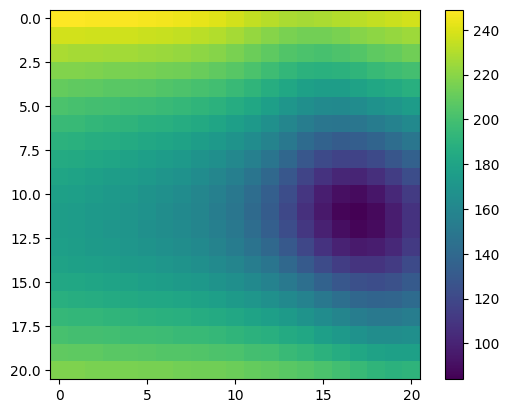

In [ ]:
check_distance=10
check_shape=(1+check_distance*2,1+check_distance*2)
check_grid=np.fromfunction(lambda x,y: np.array([x-check_distance,y-check_distance]),shape=check_shape,dtype=int)
check_grid_results=np.full(check_shape,-1)
check_grid_indexing=np.fromfunction(lambda x,y: np.array([x,y]),shape=check_shape,dtype=int)
check_arr_indexing=check_grid_indexing.reshape(2,-1)
# for i,check in enumerate(check_arr_indexing.T):
#     print(i,check,check_grid[:,check[0],check[1]])

rect_rels=mp.get_rels('r')
display(rect_rels)
for rel_set in rect_rels:
    img_a_name=rel_set[0][0]
    img_b_name=rel_set[0][1]
    img_ab_offset=rel_set[1]

    with PILImage.open(mp.get_image_paths()[img_a_name]) as open_image:
        img_arr_a=np.array(open_image)
    with PILImage.open(mp.get_image_paths()[img_b_name]) as open_image:
        img_arr_b=np.array(open_image)
    
    for i,check in enumerate(check_arr_indexing.T):
        # print(i,check,check_grid[:,check[0],check[1]],img_ab_offset+check_grid[:,check[0],check[1]])
        img_ab_offset_check=img_ab_offset+check_grid[:,check[0],check[1]]

        spans=overlap_spans(offset_vector=img_ab_offset_check,a_shape=image_sizes[img_a_name],b_shape=image_sizes[img_a_name])
        img_arr_a_region=img_arr_a[spans[1][1][0]:spans[1][1][1],spans[0][1][0]:spans[0][1][1]]
        img_arr_b_region=img_arr_b[spans[1][0][0]:spans[1][0][1],spans[0][0][0]:spans[0][0][1]]
        img_arr_diff=img_arr_a_region.astype(int)-img_arr_b_region.astype(int)
        img_arr_diff_adjusted=np.abs(img_arr_diff).astype(np.uint8)
        img_arr_meandiffsquared=np.mean(img_arr_diff**2)
        check_grid_results[check[0],check[1]]=img_arr_meandiffsquared
    print(check_grid_results)
    plt.figure()
    plt.imshow(check_grid_results)
    plt.colorbar()
    plt.show()

    # display(PILImage.fromarray(img_arr_diff_adjusted))

# Function building

In [ ]:
from os.path import abspath
from sys import path
path.insert(0, abspath("../.."))  # Repository directory relative to this file.
from MISalign.model.mis_file import MisFile,load_mis

mis_fp=r"..\..\example\data\set_a\mymis.mis"
mp=load_mis(mis_fp)

from matplotlib import pyplot as plt
import numpy as np

In [ ]:
rect_rels=mp.get_rels('r')
display(rect_rels)
print(rect_rels[0])

[[('a_myimages01.jpg', 'a_myimages02.jpg'), (12, -1088)],
 [('a_myimages02.jpg', 'a_myimages03.jpg'), (8, -1141)],
 [('a_myimages03.jpg', 'a_myimages04.jpg'), (-129, -1058)],
 [('a_myimages04.jpg', 'a_myimages05.jpg'), (11, -943)],
 [('a_myimages05.jpg', 'a_myimages06.jpg'), (5, -860)],
 [('a_myimages06.jpg', 'a_myimages07.jpg'), (10, -990)],
 [('a_myimages07.jpg', 'a_myimages08.jpg'), (9, -1009)],
 [('a_myimages08.jpg', 'a_myimages09.jpg'), (9, -939)],
 [('a_myimages09.jpg', 'a_myimages10.jpg'), (3, -722)]]

[('a_myimages01.jpg', 'a_myimages02.jpg'), (12, -1088)]


In [ ]:
PILImage.Image

In [ ]:
def axis_span(OVn:int,an_max:int,bn_max:int):
    """Takes the offset vector of axis n, image a max value for axis n, and image b max value for axis n. Returns image a and image b overlap spans for axis n."""
    if OVn==0:
        an_span=(0,min(an_max,bn_max))
        bn_span=(0,min(an_max,bn_max))
    elif OVn > 0:
        an_span=(0,an_max-OVn)
        bn_span=(OVn,an_max)
    elif OVn < 0:
        an_span=(-OVn,bn_max)
        bn_span=(0,bn_max+OVn)
    else:
        ValueError()
    return an_span,bn_span

def overlap_spans(offset_vector:tuple,a_shape:tuple,b_shape:tuple):
    """Takes an offset vector and shape of image a and image b. Returns the overlapping spans."""
    if not all([offset_vector[0]>-b_shape[0],offset_vector[0]<a_shape[0],offset_vector[1]>-b_shape[1],offset_vector[1]<a_shape[1]]):
        ValueError("These images do not overlap")
    ax_span,bx_span=axis_span(offset_vector[0],a_shape[0],b_shape[0])
    ay_span,by_span=axis_span(offset_vector[1],a_shape[1],b_shape[1])
    return (ax_span,ay_span),(bx_span,by_span)

def difference_compare(
        image_a:PILImage.Image,
        image_b:PILImage.Image,
        offset_ab:tuple,
        metric:str|function,
        return_difference=False)->float:
    """Compares difference of Image A and Image B using specified A-to-B relation and comparison metric.
    - `image_a` and `image_b` are PIL images
    - `offset_ab` is an (x,y) offset pair as generated by `MisFile.get_rels('r')`
    - `metric` can be either a string referencing a built-in metric(`diff_abs_mean`,`diff_squared_mean`) or a function of the form `metric_function(difference_array)->float`
    - Returns a float value representing the difference according to the metric
    - `return_difference` changes output to (difference_value,difference_array)
    """
    ## Find overlap spans
    a_spans,b_spans=overlap_spans(offset_ab,image_a.size,image_b.size)
    ## Take difference of overlaps
    difference_array=np.array(image_a)[a_spans[0][0]:a_spans[0][1],a_spans[1][0]:a_spans[1][1]] - np.array(image_b)[b_spans[0][0]:b_spans[0][1],b_spans[1][0]:b_spans[1][1]]
    ## Get difference metric
    if type(metric) is str:
        if metric=="diff_squared_mean":
            metric_function=lambda diff_arr: np.mean(diff_arr**2)
        elif metric=="diff_abs_mean":
            metric_function=lambda diff_arr: np.mean(np.abs(diff_arr))
    else:
        metric_function=metric
    difference_metric=metric_function(difference_array)
    ## Return of values
    if return_difference:
        return difference_metric, difference_array
    else:
        return difference_metric
def difference_gradient_analysis(
        mp:MisFile,
        relation_ab,
        strategy="full_grid",
        strategy_max=5,
        metric="diff_squared_mean",
        )->dict:
    """Compares differences of Images at multiple offsets to identify the best offset.
    - `strategy` includes `full_grid`, `local_minima`, and `gaussian_minimization`.
        - `full_grid` - search is performed from `relation`-`strategy_max` to `relation`+`strategy_max` > example: `strategy_max=3` will search a 7x7 offset space around the current offset.
        - TODO - `local_minima` - search starts with +1/-1 around `relation` and then moves to the observed minima and another +1/-1 is searched until a local minima is found.
        - TODO - `gaussian_minimization` - gaussian process regression is used to fit the minimization trend and efficiently reach the minimum value.
    - `metric` is pass-through parameter to `difference_compare`
    """
    ## Open images
    image_a=PILImage.open(mp.get_image_paths()[relation_ab[0][0]])
    image_b=PILImage.open(mp.get_image_paths()[relation_ab[0][1]])
    ## `full_grid` strategy
    # TODO
    ## Return values
    pass